In [10]:
# AF 

import os
import json
import MDAnalysis as mda
import numpy as np

In [11]:
# 
dirs = ["a", "b", "c", "d", "e", "f", "g", "h"]

PLUMED_2c_wide = "/homes/hussain/hussain-simulation_hdx/projects/masterclass-21-4/Exercise-2c_wide"

traj_name = "opes_meta_400.xtc"

traj_paths = [os.path.join(PLUMED_2c_wide, d, traj_name) for d in dirs]

top_path = "/homes/hussain/hussain-simulation_hdx/projects/masterclass-21-4/Exercise-2c_wide/a/opes_meta_400.gro"

In [12]:
plumed_test = mda.Universe(top_path, traj_paths)

print(plumed_test.trajectory)

# write to 

new_traj_name = "opes_meta_400_8.xtc"

new_traj_path = os.path.join(PLUMED_2c_wide, new_traj_name)
print(new_traj_path)

<ChainReader containing opes_meta_400.xtc and 7 more with 808 frames of 20445 atoms>
/homes/hussain/hussain-simulation_hdx/projects/masterclass-21-4/Exercise-2c_wide/opes_meta_400_8.xtc


In [13]:
with mda.Writer(new_traj_name, plumed_test.atoms.n_atoms) as W:
    for ts in plumed_test.trajectory:
        W.write(plumed_test)

In [14]:
plumed_CA = plumed_test.select_atoms("name CA")

plumed_coords = np.array([plumed_CA.positions for ts in plumed_test.trajectory])

print(plumed_coords.shape)

(808, 58, 3)


In [15]:
af_10K_top = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_0_af_sample_2000_protonated.pdb"

af_10K_traj = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_0_af_sample_2000_protonated.xtc"

In [16]:
shaw_top = "/homes/hussain/hussain-simulation_hdx/downloads/bpti.pdb"

shaw_stride_traj = "/homes/hussain/hussain-simulation_hdx/downloads/reduced_BPTI_SHAW_stride_1000.xtc"

shaw_traj = mda.Universe(shaw_top, shaw_stride_traj)
shaw_traj_ca = shaw_traj.select_atoms("name CA")
shaw_traj_coords = np.array([shaw_traj_ca.positions for ts in shaw_traj.trajectory])

print(shaw_traj_coords.shape)

(4125, 58, 3)


In [17]:
af_10K_0_top = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_0_af_sample_10000_protonated.pdb"
af_10K_0_traj = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_0_af_sample_10000_protonated.xtc"

af_10K_0 = mda.Universe(af_10K_0_top, af_10K_0_traj)
af_10K_0_CA = af_10K_0.select_atoms("name CA")
af_10_0_coords = np.array([af_10K_0_CA.positions for ts in af_10K_0.trajectory])

print(af_10_0_coords.shape)


(11000, 58, 3)


In [18]:
af_10K_1_top = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_1_af_sample_10000_protonated.pdb"
af_10K_1_traj = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_1_af_sample_10000_protonated.xtc"

af_10K_1 = mda.Universe(af_10K_1_top, af_10K_1_traj)
af_10K_1_CA = af_10K_0.select_atoms("name CA")
af_10_1_coords = np.array([af_10K_0_CA.positions for ts in af_10K_1.trajectory])

print(af_10_1_coords.shape)


/homes/hussain/hussain-simulation_hdx/programs/miniconda3/envs/p310_MDA/lib/python3.10/site-packages/MDAnalysis/coordinates/XDR.py:240: UserWarning: Reload offsets from trajectory
 ctime or size or n_atoms did not match
  warnings.warn("Reload offsets from trajectory\n "


(11000, 58, 3)


In [19]:
af_10K_2_top = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_2_af_sample_10000_protonated.pdb"
af_10K_2_traj = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_2_af_sample_10000_protonated.xtc"

af_10K_2 = mda.Universe(af_10K_2_top, af_10K_2_traj)
af_10K_2_CA = af_10K_2.select_atoms("name CA")
af_10_2_coords = np.array([af_10K_2_CA.positions for ts in af_10K_2.trajectory])
print(af_10_2_coords.shape)


(11000, 58, 3)


In [20]:
af_10K_3_top = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_3_af_sample_10000_protonated.pdb"
af_10K_3_traj = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_3_af_sample_10000_protonated.xtc"

af_10K_3 = mda.Universe(af_10K_3_top, af_10K_3_traj)
af_10K_3_CA = af_10K_3.select_atoms("name CA")

af_10_3_coords = np.array([af_10K_3_CA.positions for ts in af_10K_3.trajectory])

print(af_10_3_coords.shape)


(11000, 58, 3)


In [21]:
all_coords = np.concatenate([plumed_coords, af_10_0_coords, af_10_2_coords, af_10_3_coords, shaw_traj_coords], axis=0)

In [22]:
all_coords.shape

(37933, 58, 3)

In [23]:

def convert_coords(all_coords:np.array):

    expanded_coords = all_coords[:, np.newaxis, :, :]

    pairwise_diff = expanded_coords - all_coords[:, :, np.newaxis, :]  
    # Calculate Euclidean distances, result shape is (frames, res, res)
    distance_matrices = np.sqrt(np.sum(pairwise_diff**2, axis=-1))

    reshaped_matrices = distance_matrices.reshape(distance_matrices.shape[0], distance_matrices.shape[1]* distance_matrices.shape[2])

    return reshaped_matrices


In [24]:
def rmsd_coords(all_coords:np.array, ref_coords:np.array):

    expanded_coords = all_coords[:, np.newaxis, :, :]

    # ref_coords = all_coords[ref_index]

    pairwise_diff = expanded_coords - ref_coords[np.newaxis, :, :]

    # Calculate Euclidean distances, result shape is (frames, res, res)
    distance_matrices = np.sqrt(np.sum(pairwise_diff**2, axis=-1))

    # Calculate RMSD
    rmsd = np.sqrt(np.mean(distance_matrices**2, axis=-1))

    return rmsd


In [25]:
def PCA_ref_distance(pca_coords:np.array, ref_coords:np.array):
    # pca cords shape (frames, n_components)

    pairwise_diff = pca_coords - ref_coords

    # Calculate RMSD over each frame

    rmsd = np.sqrt(np.mean(pairwise_diff**2, axis=-1))

    return rmsd



In [26]:
PCA_all_coords = convert_coords(all_coords)

PCA_plumed_coords = convert_coords(plumed_coords)

PCA_af_10_0_coords = convert_coords(af_10_0_coords)

PCA_af_10_1_coords = convert_coords(af_10_1_coords)

PCA_af_10_2_coords = convert_coords(af_10_2_coords)

PCA_af_10_3_coords = convert_coords(af_10_3_coords)

PCA_shaw_traj_coords = convert_coords(shaw_traj_coords) 


In [27]:
ref_coords = all_coords[0]

RMSD_all_coords = rmsd_coords(all_coords,ref_coords)

RMSD_plumed_coords = rmsd_coords(plumed_coords, ref_coords)

RMSD_af_10_0_coords = rmsd_coords(af_10_0_coords, ref_coords)

RMSD_af_10_1_coords = rmsd_coords(af_10_1_coords, ref_coords)

RMSD_af_10_2_coords = rmsd_coords(af_10_2_coords, ref_coords)

RMSD_af_10_3_coords = rmsd_coords(af_10_3_coords, ref_coords)

RMSD_shaw_traj_coords = rmsd_coords(shaw_traj_coords, ref_coords)


O_ref = 803

O_ref_coords = all_coords[O_ref]

O_RMSD_all_coords = rmsd_coords(all_coords,O_ref_coords)

O_RMSD_plumed_coords = rmsd_coords(plumed_coords,O_ref_coords)

O_RMSD_af_10_0_coords = rmsd_coords(af_10_0_coords,O_ref_coords)

O_RMSD_af_10_1_coords = rmsd_coords(af_10_1_coords,O_ref_coords)

O_RMSD_af_10_2_coords = rmsd_coords(af_10_2_coords,O_ref_coords)

O_RMSD_af_10_3_coords = rmsd_coords(af_10_3_coords,O_ref_coords)

O_RMSD_shaw_traj_coords = rmsd_coords(shaw_traj_coords,O_ref_coords)

In [28]:

ref_coords = PCA_all_coords[0]
PCA_ref_dist_all_coords = PCA_ref_distance(PCA_all_coords,ref_coords)

PCA_ref_dist_plumed_coords = PCA_ref_distance(PCA_plumed_coords,ref_coords)

PCA_ref_dist_af_10_0_coords = PCA_ref_distance(PCA_af_10_0_coords,ref_coords)

PCA_ref_dist_af_10_1_coords = PCA_ref_distance(PCA_af_10_1_coords,ref_coords)

PCA_ref_dist_af_10_2_coords = PCA_ref_distance(PCA_af_10_2_coords,ref_coords)

PCA_ref_dist_af_10_3_coords = PCA_ref_distance(PCA_af_10_3_coords,ref_coords)

PCA_ref_dist_shaw_traj_coords = PCA_ref_distance(PCA_shaw_traj_coords,ref_coords)

O_ref_coords = PCA_all_coords[O_ref]


O_PCA_ref_dist_all_coords = PCA_ref_distance(PCA_all_coords,O_ref_coords)

O_PCA_ref_dist_plumed_coords = PCA_ref_distance(PCA_plumed_coords,O_ref_coords)

O_PCA_ref_dist_af_10_0_coords = PCA_ref_distance(PCA_af_10_0_coords,O_ref_coords)

O_PCA_ref_dist_af_10_1_coords = PCA_ref_distance(PCA_af_10_1_coords,O_ref_coords)

O_PCA_ref_dist_af_10_2_coords = PCA_ref_distance(PCA_af_10_2_coords,O_ref_coords)

O_PCA_ref_dist_af_10_3_coords = PCA_ref_distance(PCA_af_10_3_coords,O_ref_coords)

O_PCA_ref_dist_shaw_traj_coords = PCA_ref_distance(PCA_shaw_traj_coords,O_ref_coords)



In [29]:
O_PCA_ref_dist_plumed_coords.shape

(808,)

In [30]:
# do PCA
import numpy as np
from sklearn.decomposition import PCA








print(all_coords.shape)

pca = PCA(n_components=2)

pca.fit(PCA_all_coords)

plumed_transformed = pca.transform(PCA_plumed_coords)

af_10_0_transformed = pca.transform(PCA_af_10_0_coords)

af_10_1_transformed = pca.transform(PCA_af_10_1_coords)

af_10_2_transformed = pca.transform(PCA_af_10_2_coords)

af_10_3_transformed = pca.transform(PCA_af_10_3_coords)


shaw_traj_transformed = pca.transform(PCA_shaw_traj_coords)


(37933, 58, 3)


In [31]:
af_10_0_ranks_path = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_0_af_sample_10000_ranks.json"
af_10_1_ranks_path = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_1_af_sample_10000_ranks.json"
af_10_2_ranks_path = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_2_af_sample_10000_ranks.json"
af_10_3_ranks_path = "/homes/hussain/hussain-simulation_hdx/projects/xFold_Sampling/af_sample/BPTI/P00974_60_3_af_sample_10000_ranks.json"



with open(af_10_0_ranks_path, "r") as f:
    af_10_0_ranks = json.load(f)

with open(af_10_1_ranks_path, "r") as f:
    af_10_1_ranks = json.load(f)

with open(af_10_2_ranks_path, "r") as f:
    af_10_2_ranks = json.load(f)

with open(af_10_3_ranks_path, "r") as f:    
    af_10_3_ranks = json.load(f)




In [32]:
def extract_key_af_sample(json_dict: dict[dict], key:str="plddt"):

    values = []
    for msa, entry in json_dict.items():
        for rank, vals in entry.items():
            values.append(vals[key])

    return values


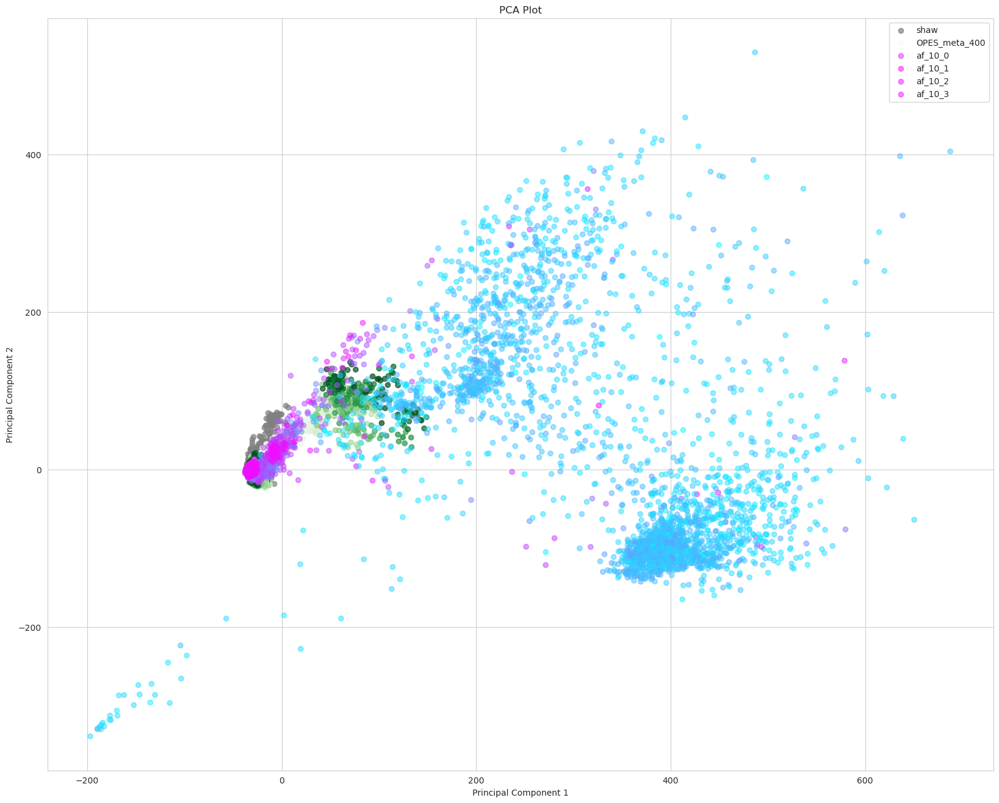

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "ptm"
af_10_0_indexes = extract_key_af_sample(af_10_0_ranks, key)
af_10_1_indexes = extract_key_af_sample(af_10_1_ranks, key)
af_10_2_indexes = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_indexes = extract_key_af_sample(af_10_3_ranks, key)
 

plt.scatter(shaw_traj_transformed[:, 0], shaw_traj_transformed[:, 1], label="shaw", alpha=0.7, c="grey")

plt.scatter(plumed_transformed[:, 0], plumed_transformed[:, 1], label="OPES_meta_400", alpha=0.7, c=plumed_indexes, cmap="Greens")

plt.scatter(af_10_0_transformed[:, 0], af_10_0_transformed[:, 1], label="af_10_0", alpha=0.5, c=af_10_0_indexes, cmap="cool")

plt.scatter(af_10_1_transformed[:, 0], af_10_1_transformed[:, 1], label="af_10_1", alpha=0.5, c=af_10_1_indexes, cmap="cool")


plt.scatter(af_10_2_transformed[:, 0], af_10_2_transformed[:, 1], label="af_10_2", alpha=0.5, c=af_10_2_indexes, cmap="cool")

plt.scatter(af_10_3_transformed[:, 0], af_10_3_transformed[:, 1], label="af_10_3", alpha=0.5, c=af_10_3_indexes, cmap="cool")


# Set the axis labels and title
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Plot")
plt.legend()
# Show the plot
plt.show()

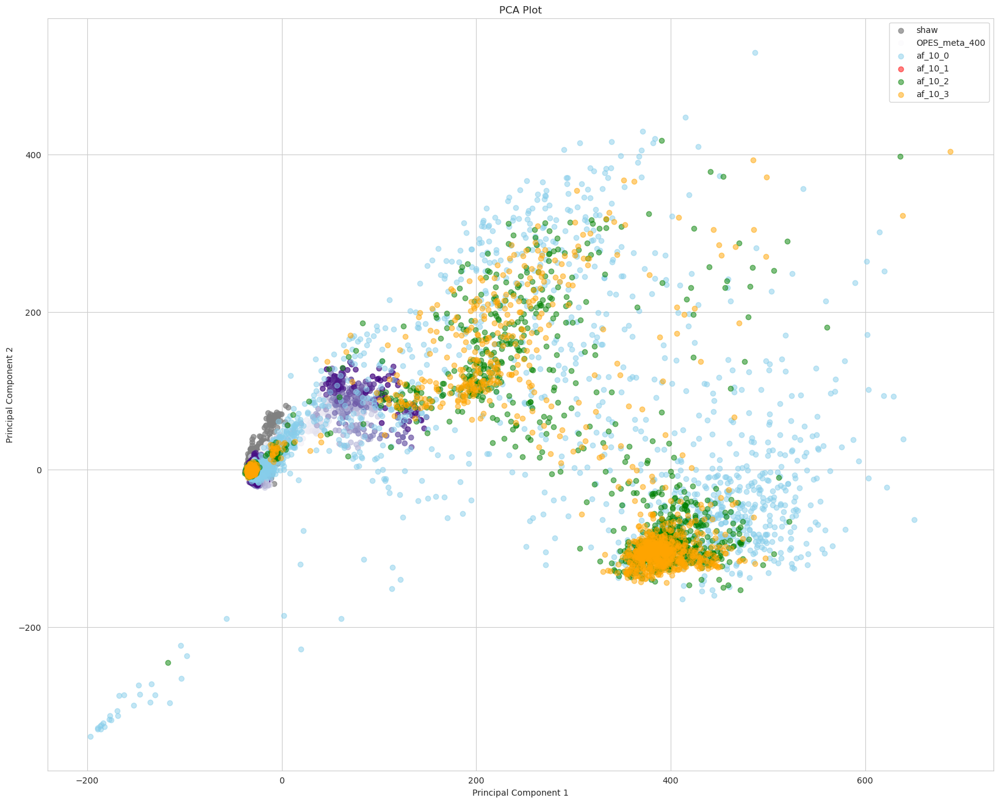

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "ptm"
af_10_0_indexes = extract_key_af_sample(af_10_0_ranks, key)
af_10_1_indexes = extract_key_af_sample(af_10_1_ranks, key)
af_10_2_indexes = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_indexes = extract_key_af_sample(af_10_3_ranks, key)
 

plt.scatter(shaw_traj_transformed[:, 0], shaw_traj_transformed[:, 1], label="shaw", alpha=0.7, c="grey")

plt.scatter(plumed_transformed[:, 0], plumed_transformed[:, 1], label="OPES_meta_400", alpha=0.7, c=plumed_indexes, cmap="Purples")

plt.scatter(af_10_0_transformed[:, 0], af_10_0_transformed[:, 1], label="af_10_0", alpha=0.5, c="skyblue")

plt.scatter(af_10_1_transformed[:, 0], af_10_1_transformed[:, 1], label="af_10_1", alpha=0.5, c="red")


plt.scatter(af_10_2_transformed[:, 0], af_10_2_transformed[:, 1], label="af_10_2", alpha=0.5, c="green")

plt.scatter(af_10_3_transformed[:, 0], af_10_3_transformed[:, 1], label="af_10_3", alpha=0.5, c="orange")


# Set the axis labels and title
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Plot")
plt.legend()
# Show the plot
plt.show()

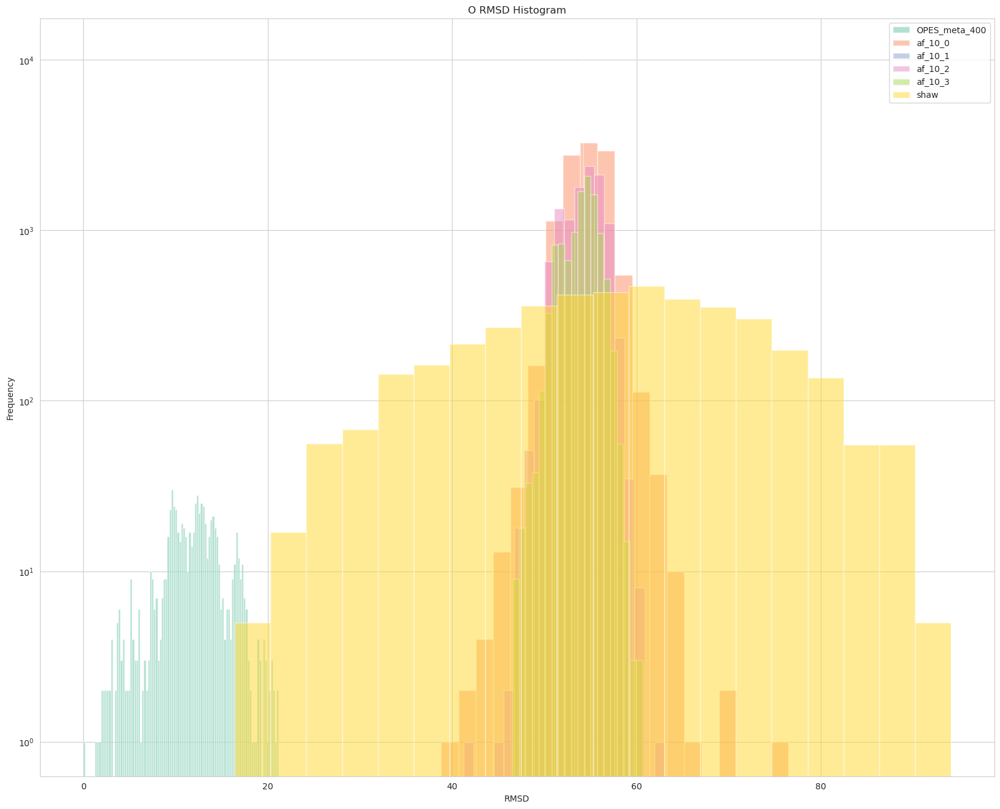

In [35]:
plt.figure(figsize=(20, 16))

plt.hist(O_RMSD_plumed_coords, bins=100, alpha=0.5, label="OPES_meta_400")

plt.hist(O_RMSD_af_10_0_coords, bins=20, alpha=0.5, label="af_10_0")

plt.hist(O_RMSD_af_10_1_coords, bins=20, alpha=0.5, label="af_10_1")

plt.hist(O_RMSD_af_10_2_coords, bins=20, alpha=0.5, label="af_10_2")

plt.hist(O_RMSD_af_10_3_coords, bins=20, alpha=0.5, label="af_10_3")


plt.hist(O_RMSD_shaw_traj_coords, bins=20, alpha=0.5, label="shaw")

plt.xlabel("RMSD")

plt.ylabel("Frequency")

plt.yscale("log")
plt.title("O RMSD Histogram")

plt.legend()



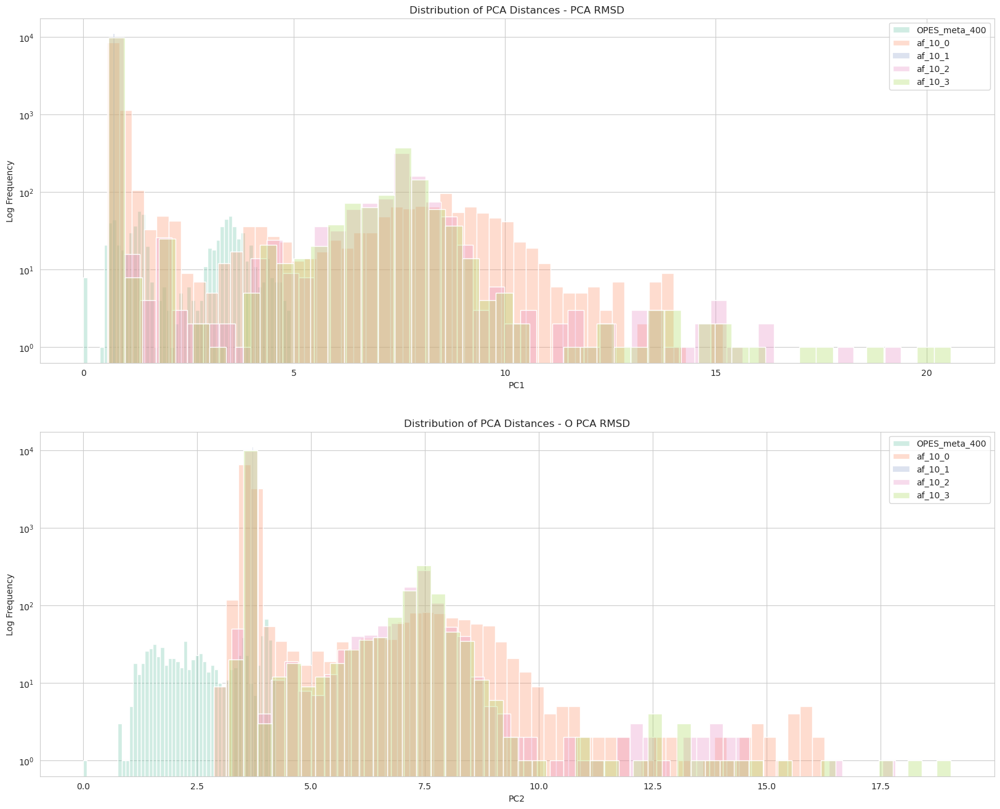

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Data Preparation
# Assuming you have these numpy arrays from PCA transformations
# e.g., plumed_transformed = np.array([...])

# Define a function to plot histograms for each PCA axis
def plot_pca_2_state_histograms(data, data2, labels, title_prefix):
    plt.figure(figsize=(20, 16))

    # Histogram for PC1
    plt.subplot(2, 1, 1)  # 1 row, 2 columns, 1st subplot
    for i, label in enumerate(labels):
        
        sns.histplot(data[i], bins=50, kde=False, label=label, alpha=0.3)
    plt.title(f'{title_prefix} - PCA RMSD')
    plt.xlabel('PC1')
    plt.ylabel('Log Frequency')
    plt.yscale('log')
    plt.legend()

    # Histogram for PC2
    plt.subplot(2, 1, 2)  # 1 row, 2 columns, 2nd subplot
    for i, label in enumerate(labels):
        sns.histplot(data2[i], bins=50, kde=False, label=label, alpha=0.3)
    plt.title(f'{title_prefix} - O PCA RMSD')
    plt.xlabel('PC2')
    plt.ylabel('Log Frequency')
    plt.legend()
    plt.yscale('log')
    plt.show()

# Collect data and labels
data = [PCA_ref_dist_plumed_coords, PCA_ref_dist_af_10_0_coords, PCA_ref_dist_af_10_1_coords, PCA_ref_dist_af_10_2_coords, PCA_ref_dist_af_10_3_coords] #, PCA_ref_dist_shaw_traj_coords]
data2 = [ O_PCA_ref_dist_plumed_coords, O_PCA_ref_dist_af_10_0_coords,O_PCA_ref_dist_af_10_1_coords, O_PCA_ref_dist_af_10_2_coords, O_PCA_ref_dist_af_10_3_coords] #, O_PCA_ref_dist_shaw_traj_coords]
labels = ['OPES_meta_400', 'af_10_0', 'af_10_1', 'af_10_2', 'af_10_3'] #, 'shaw']

# Plot histograms
plot_pca_2_state_histograms(data, data2, labels, "Distribution of PCA Distances")


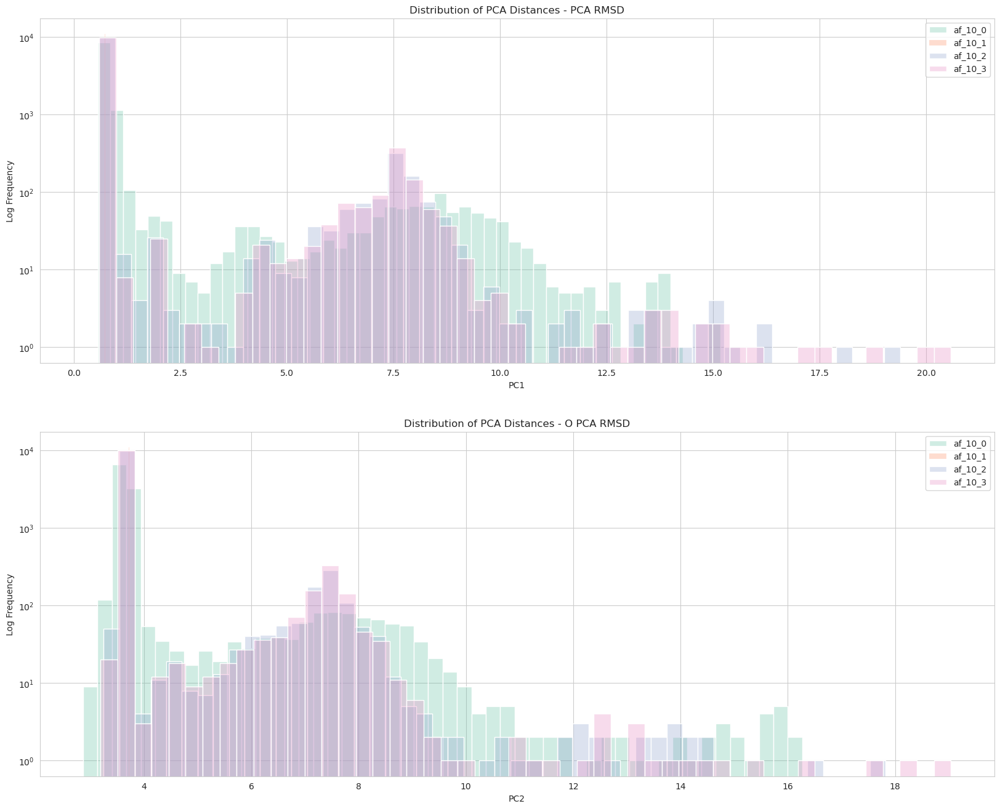

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Data Preparation
# Assuming you have these numpy arrays from PCA transformations
# e.g., plumed_transformed = np.array([...])

# Define a function to plot histograms for each PCA axis
def plot_pca_2_state_histograms(data, data2, labels, title_prefix):
    plt.figure(figsize=(20, 16))

    # Histogram for PC1
    plt.subplot(2, 1, 1)  # 1 row, 2 columns, 1st subplot
    for i, label in enumerate(labels):
        
        sns.histplot(data[i], bins=50, kde=False, label=label, alpha=0.3)
    plt.title(f'{title_prefix} - PCA RMSD')
    plt.xlabel('PC1')
    plt.ylabel('Log Frequency')
    plt.yscale('log')
    plt.legend()

    # Histogram for PC2
    plt.subplot(2, 1, 2)  # 1 row, 2 columns, 2nd subplot
    for i, label in enumerate(labels):
        sns.histplot(data2[i], bins=50, kde=False, label=label, alpha=0.3)
    plt.title(f'{title_prefix} - O PCA RMSD')
    plt.xlabel('PC2')
    plt.ylabel('Log Frequency')
    plt.legend()
    plt.yscale('log')
    plt.show()

# Collect data and labels
data = [PCA_ref_dist_af_10_0_coords, PCA_ref_dist_af_10_1_coords, PCA_ref_dist_af_10_2_coords, PCA_ref_dist_af_10_3_coords] #, PCA_ref_dist_shaw_traj_coords]
data2 = [O_PCA_ref_dist_af_10_0_coords,O_PCA_ref_dist_af_10_1_coords, O_PCA_ref_dist_af_10_2_coords, O_PCA_ref_dist_af_10_3_coords] #, O_PCA_ref_dist_shaw_traj_coords]
labels = ['af_10_0', 'af_10_1', 'af_10_2', 'af_10_3'] #, 'shaw']

# Plot histograms
plot_pca_2_state_histograms(data, data2, labels, "Distribution of PCA Distances")


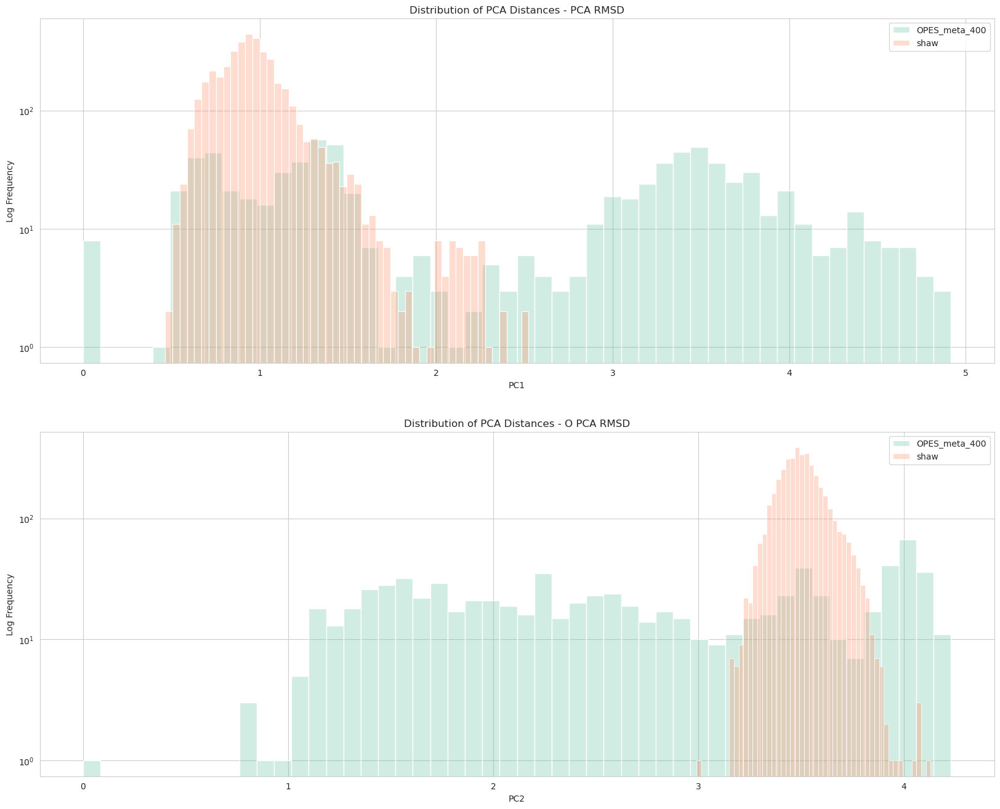

In [38]:

# Collect data and labels
data = [PCA_ref_dist_plumed_coords, PCA_ref_dist_shaw_traj_coords]
data2 = [ O_PCA_ref_dist_plumed_coords, O_PCA_ref_dist_shaw_traj_coords]
labels = ['OPES_meta_400', 'shaw']

# Plot histograms
plot_pca_2_state_histograms(data, data2, labels, "Distribution of PCA Distances")

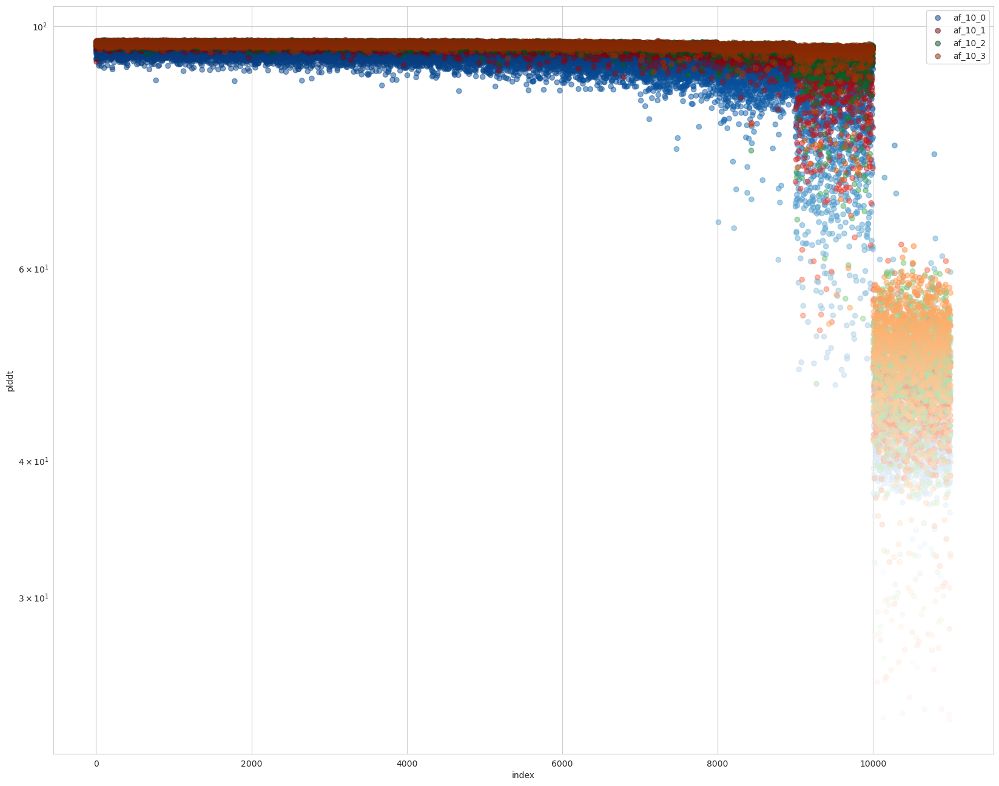

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "plddt"
af_10_0_plddt = extract_key_af_sample(af_10_0_ranks, key)

af_10_1_plddt = extract_key_af_sample(af_10_1_ranks, key)
af_10_2_plddt = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_plddt = extract_key_af_sample(af_10_3_ranks, key)
 

key = "max_pae"
af_10_0_max_pae = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_max_pae = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_max_pae = extract_key_af_sample(af_10_3_ranks, key)
 
key = "ptm"

af_10_0_ptm = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_ptm = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_ptm = extract_key_af_sample(af_10_3_ranks, key)



plt.scatter([i for i in range(1,len(af_10_0_plddt)+1)], af_10_0_plddt, label="af_10_0", alpha=0.5, c=af_10_0_plddt, cmap="Blues")

plt.scatter([i for i in range(1,len(af_10_1_plddt)+1)], af_10_1_plddt, label="af_10_1", alpha=0.5, c=af_10_1_plddt, cmap="Reds")

plt.scatter([i for i in range(1,len(af_10_2_plddt)+1)], af_10_2_plddt, label="af_10_2", alpha=0.5, c=af_10_2_plddt, cmap="Greens")

plt.scatter([i for i in range(1,len(af_10_3_plddt)+1)], af_10_3_plddt, label="af_10_3", alpha=0.5, c=af_10_3_plddt, cmap="Oranges")

# Set the axis labels and title
plt.xlabel("index")
plt.ylabel("plddt")

plt.yscale("log")

plt.legend()
# Show the plot
plt.show()

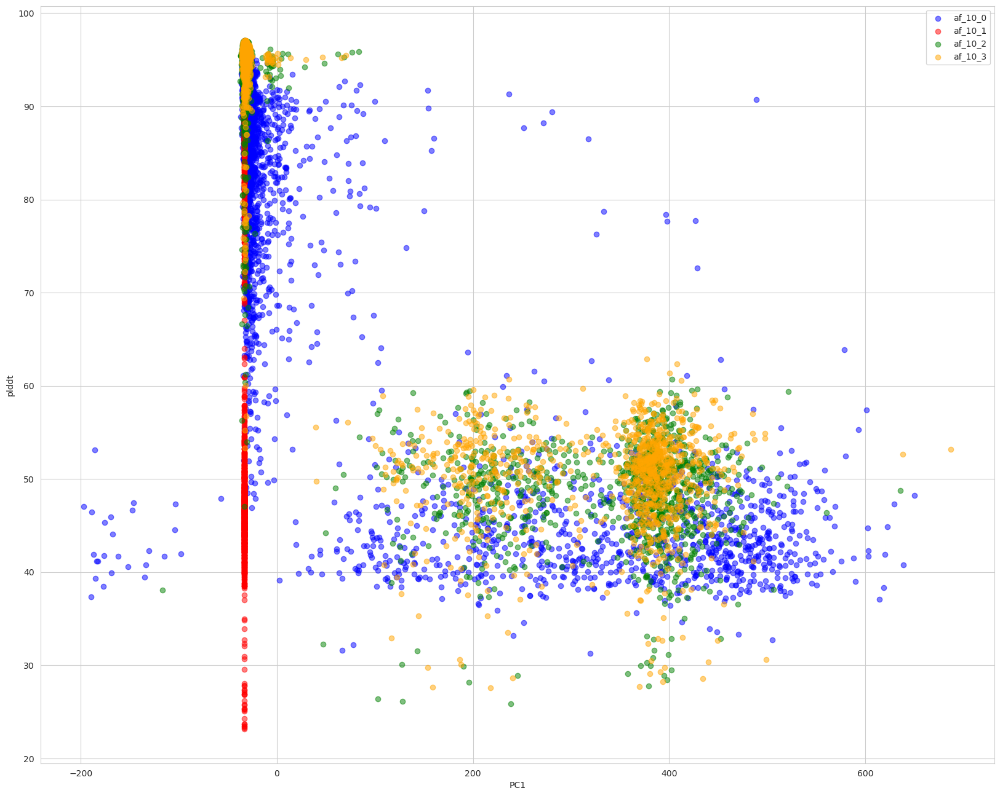

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "plddt"
af_10_0_plddt = extract_key_af_sample(af_10_0_ranks, key)
af_10_1_plddt = extract_key_af_sample(af_10_1_ranks, key)
af_10_2_plddt = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_plddt = extract_key_af_sample(af_10_3_ranks, key)
 

key = "max_pae"
af_10_0_max_pae = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_max_pae = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_max_pae = extract_key_af_sample(af_10_3_ranks, key)
 
key = "ptm"

af_10_0_ptm = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_ptm = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_ptm = extract_key_af_sample(af_10_3_ranks, key)



plt.scatter(af_10_0_transformed[:, 0], af_10_0_plddt, label="af_10_0", alpha=0.5, c="Blue")

plt.scatter(af_10_1_transformed[:, 0], af_10_1_plddt, label="af_10_1", alpha=0.5, c="Red")


plt.scatter(af_10_2_transformed[:, 0], af_10_2_plddt, label="af_10_2", alpha=0.5, c="Green")

plt.scatter(af_10_3_transformed[:, 0], af_10_3_plddt, label="af_10_3", alpha=0.5, c="Orange")

# Set the axis labels and title
plt.xlabel("PC1")
plt.ylabel("plddt")


# plt.xscale("log")

plt.legend()
# Show the plot
plt.show()

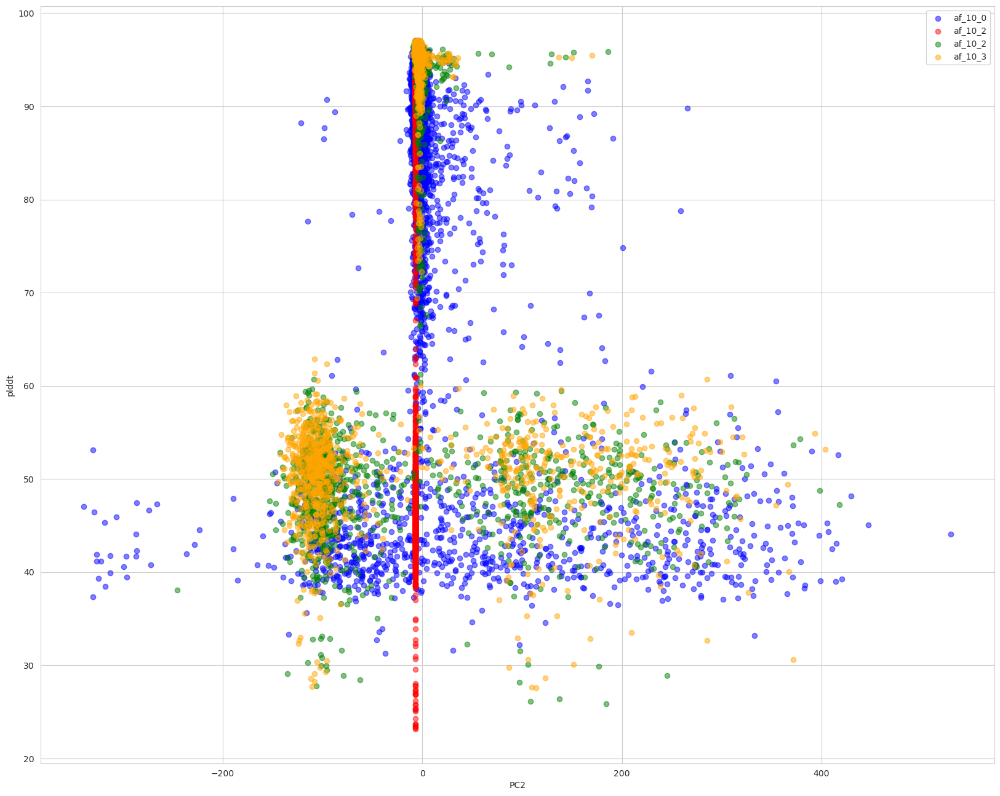

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "plddt"
af_10_0_plddt = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_plddt = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_plddt = extract_key_af_sample(af_10_3_ranks, key)
 

key = "max_pae"
af_10_0_max_pae = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_max_pae = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_max_pae = extract_key_af_sample(af_10_3_ranks, key)
 
key = "ptm"

af_10_0_ptm = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_ptm = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_ptm = extract_key_af_sample(af_10_3_ranks, key)



plt.scatter(af_10_0_transformed[:, 1], af_10_0_plddt, label="af_10_0", alpha=0.5, c="Blue")

plt.scatter(af_10_1_transformed[:, 1], af_10_1_plddt, label="af_10_2", alpha=0.5, c="Red")

plt.scatter(af_10_2_transformed[:, 1], af_10_2_plddt, label="af_10_2", alpha=0.5, c="Green")

plt.scatter(af_10_3_transformed[:, 1], af_10_3_plddt, label="af_10_3", alpha=0.5, c="Orange")

# Set the axis labels and title
plt.xlabel("PC2")
plt.ylabel("plddt")


# plt.xscale("log")

plt.legend()
# Show the plot
plt.show()

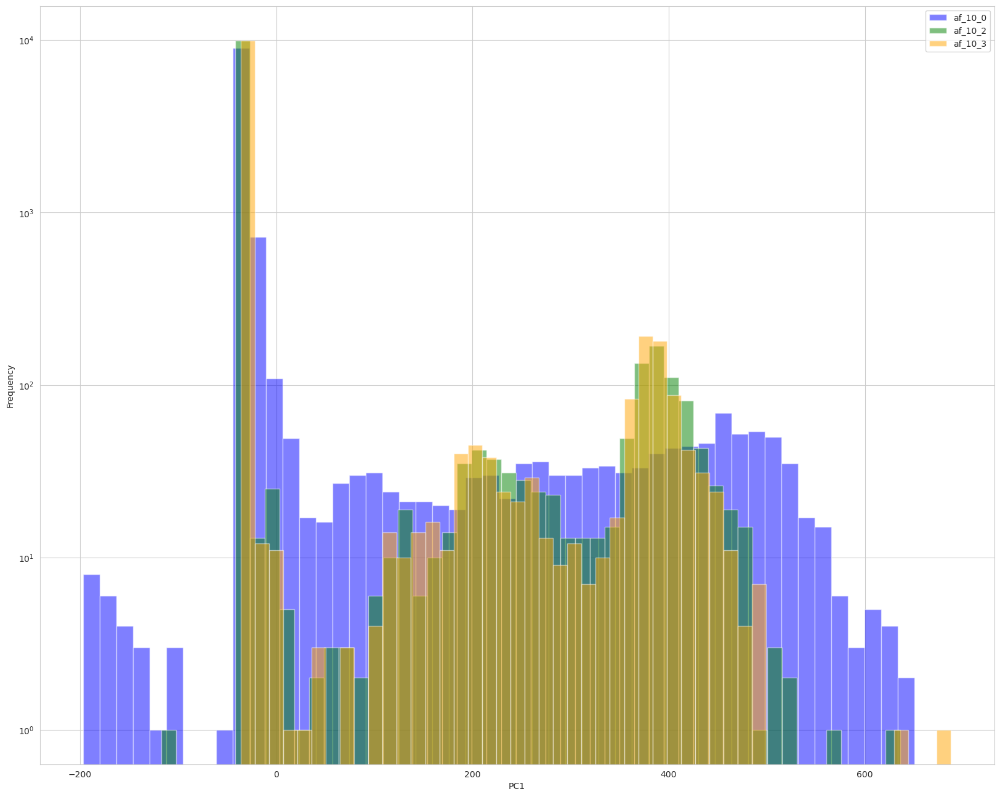

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "plddt"
af_10_0_plddt = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_plddt = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_plddt = extract_key_af_sample(af_10_3_ranks, key)
 

key = "max_pae"
af_10_0_max_pae = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_max_pae = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_max_pae = extract_key_af_sample(af_10_3_ranks, key)
 
key = "ptm"

af_10_0_ptm = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_ptm = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_ptm = extract_key_af_sample(af_10_3_ranks, key)



plt.hist(af_10_0_transformed[:, 0], label="af_10_0", alpha=0.5, color="Blue", bins=50)

plt.hist(af_10_2_transformed[:, 0], label="af_10_2", alpha=0.5, color="Green", bins=50)

plt.hist(af_10_3_transformed[:, 0],  label="af_10_3", alpha=0.5, color="Orange", bins=50)

# Set the axis labels and title
plt.xlabel("PC1")
plt.ylabel("Frequency")


plt.yscale("log")

plt.legend()
# Show the plot
plt.show()

In [43]:
af_10_0_plddt.shape

AttributeError: 'list' object has no attribute 'shape'

In [ ]:
PCA_af_10_0_coords[:0].shape

(0, 3364)

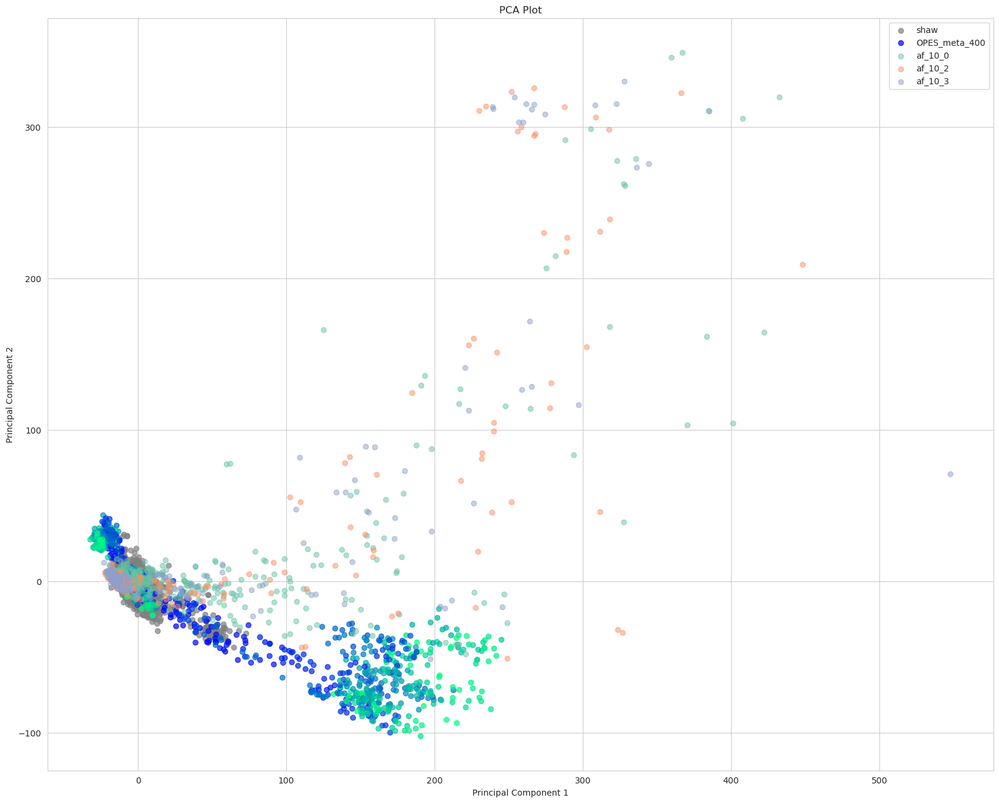

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)



plt.scatter(shaw_traj_transformed[:, 0], shaw_traj_transformed[:, 1], label="shaw", alpha=0.7, c="grey")

plt.scatter(plumed_transformed[:, 0], plumed_transformed[:, 1], label="OPES_meta_400", alpha=0.7, c=plumed_indexes, cmap="winter")

plt.scatter(af_10_0_transformed[:, 0], af_10_0_transformed[:, 1], label="af_10_0", alpha=0.5)

plt.scatter(af_10_2_transformed[:, 0], af_10_2_transformed[:, 1], label="af_10_2", alpha=0.5) #, c=af_10_2_indexes, cmap="cool")

plt.scatter(af_10_3_transformed[:, 0], af_10_3_transformed[:, 1], label="af_10_3", alpha=0.5) #, c=af_10_3_indexes, cmap="cool")


# Set the axis labels and title
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Plot")
plt.legend()
# Show the plot
plt.show()

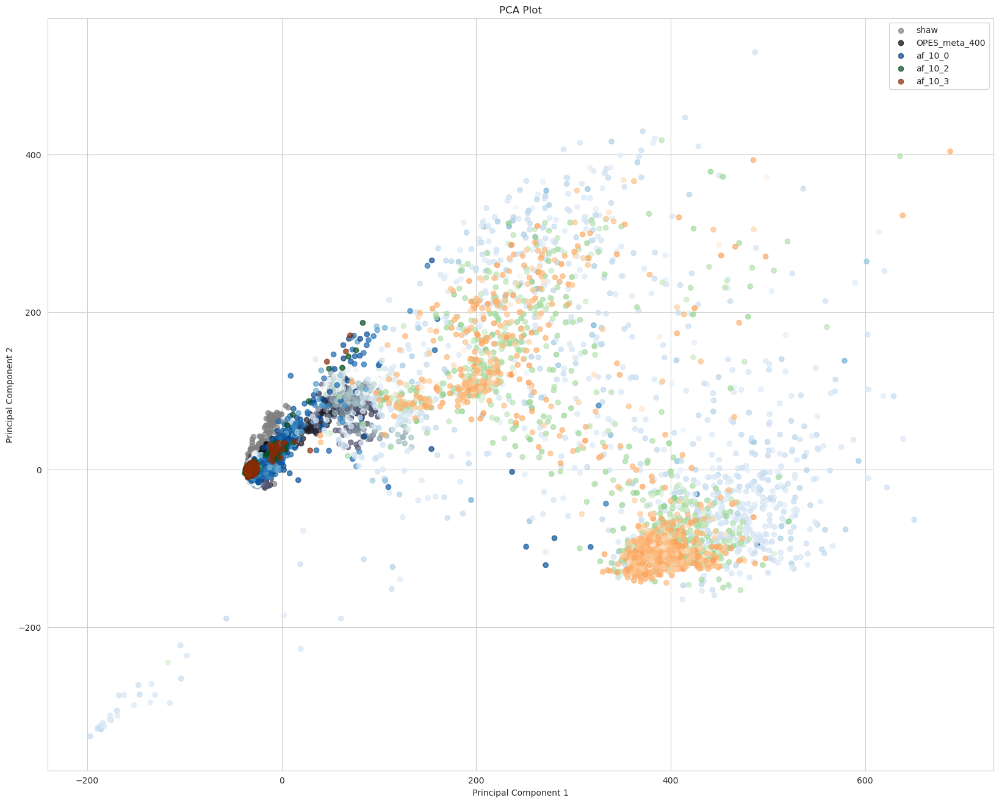

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "plddt"
af_10_0_indexes = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_indexes = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_indexes = extract_key_af_sample(af_10_3_ranks, key)
 
plt.scatter(shaw_traj_transformed[:, 0], shaw_traj_transformed[:, 1], label="shaw", alpha=0.7, c="grey")


plt.scatter(plumed_transformed[:, 0], plumed_transformed[:, 1], label="OPES_meta_400", alpha=0.7, c=plumed_indexes, cmap="bone")

plt.scatter(af_10_0_transformed[:, 0], af_10_0_transformed[:, 1], label="af_10_0", alpha=0.7, c=af_10_0_indexes, cmap="Blues")

plt.scatter(af_10_2_transformed[:, 0], af_10_2_transformed[:, 1], label="af_10_2", alpha=0.7, c=af_10_2_indexes, cmap="Greens")

plt.scatter(af_10_3_transformed[:, 0], af_10_3_transformed[:, 1], label="af_10_3", alpha=0.7, c=af_10_3_indexes, cmap="Oranges")


# Set the axis labels and title
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Plot")
plt.legend()
# Show the plot
plt.show()

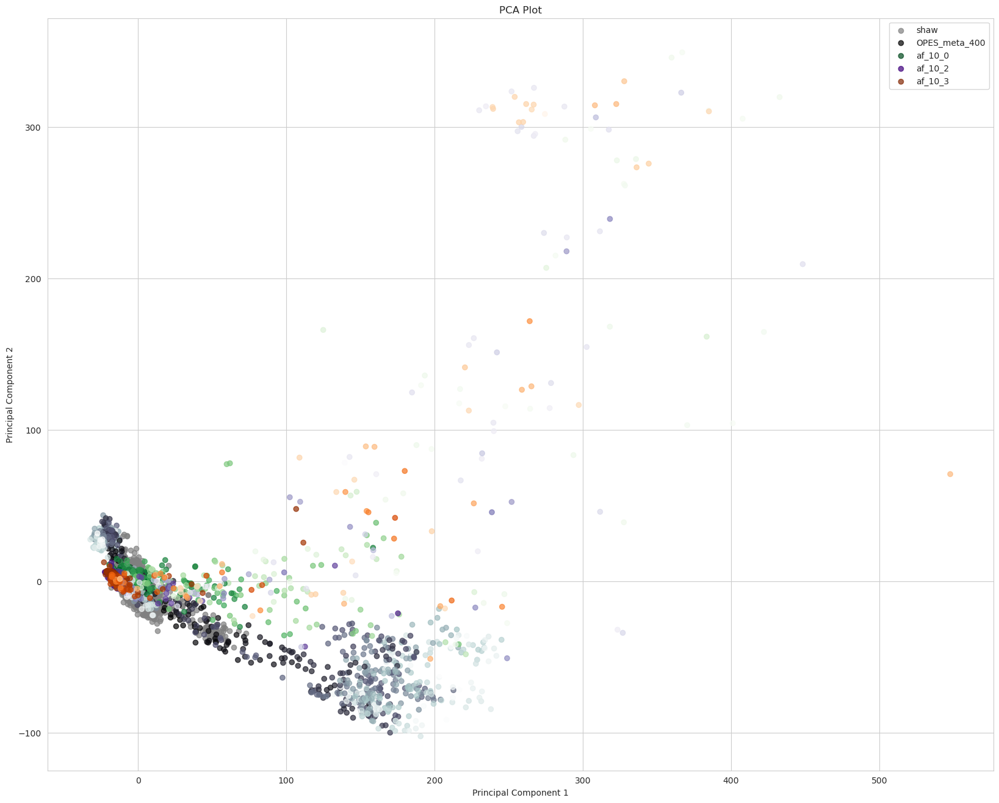

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import json
# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Set the figure size
plt.figure(figsize=(20, 16))

# Plot the data

plumed_indexes = [i for i in range(len(plumed_transformed)//len(dirs))]*len(dirs)


key = "ptm"
af_10_0_indexes = extract_key_af_sample(af_10_0_ranks, key)
af_10_2_indexes = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_indexes = extract_key_af_sample(af_10_3_ranks, key)
 
plt.scatter(shaw_traj_transformed[:, 0], shaw_traj_transformed[:, 1], label="shaw", alpha=0.7, c="grey")


plt.scatter(plumed_transformed[:, 0], plumed_transformed[:, 1], label="OPES_meta_400", alpha=0.7, c=plumed_indexes, cmap="bone")

plt.scatter(af_10_0_transformed[:, 0], af_10_0_transformed[:, 1], label="af_10_0", alpha=0.7, c=af_10_0_indexes, cmap="Greens")

plt.scatter(af_10_2_transformed[:, 0], af_10_2_transformed[:, 1], label="af_10_2", alpha=0.7, c=af_10_2_indexes, cmap="Purples")

plt.scatter(af_10_3_transformed[:, 0], af_10_3_transformed[:, 1], label="af_10_3", alpha=0.7, c=af_10_3_indexes, cmap="Oranges")


# Set the axis labels and title
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Plot")
plt.legend()
# Show the plot
plt.show()

In [ ]:
import plotly.graph_objects as go

# Assuming all necessary data and functions (`extract_key_af_sample`, etc.) are already defined and available

# Create the figure object
fig = go.Figure()

# Adding scatter plots for each dataset
fig.add_trace(go.Scatter(x=plumed_transformed[:, 0], y=plumed_transformed[:, 1],
                         mode='markers', name='OPES_meta_400',
                         marker=dict(color=plumed_indexes, colorscale='speed', opacity=0.7),
                         text=[f"Frame {i}" for i in range(len(plumed_transformed))]))

fig.add_trace(go.Scatter(x=af_10_0_transformed[:, 0], y=af_10_0_transformed[:, 1],
                         mode='markers', name='af_10_0',
                         marker=dict(color=af_10_0_indexes, colorscale='dense', opacity=0.5),
                         text=[f"Frame {i}" for i in range(len(af_10_0_transformed))]))

fig.add_trace(go.Scatter(x=af_10_2_transformed[:, 0], y=af_10_2_transformed[:, 1],
                         mode='markers', name='af_10_2',
                         marker=dict(color=af_10_2_indexes, colorscale='magma', opacity=0.5),
                         text=[f"Frame {i}" for i in range(len(af_10_2_transformed))]))

fig.add_trace(go.Scatter(x=af_10_3_transformed[:, 0], y=af_10_3_transformed[:, 1],
                         mode='markers', name='af_10_3',
                         marker=dict(color=af_10_3_indexes, colorscale='viridis', opacity=0.5),
                         text=[f"Frame {i}" for i in range(len(af_10_3_transformed))]))

# Setting plot layout
fig.update_layout(title="PCA Plot",
                  xaxis_title="Principal Component 1",
                  yaxis_title="Principal Component 2",
                  legend_title="Legend",
                  template="plotly_white")

# Show the plot
fig.show()


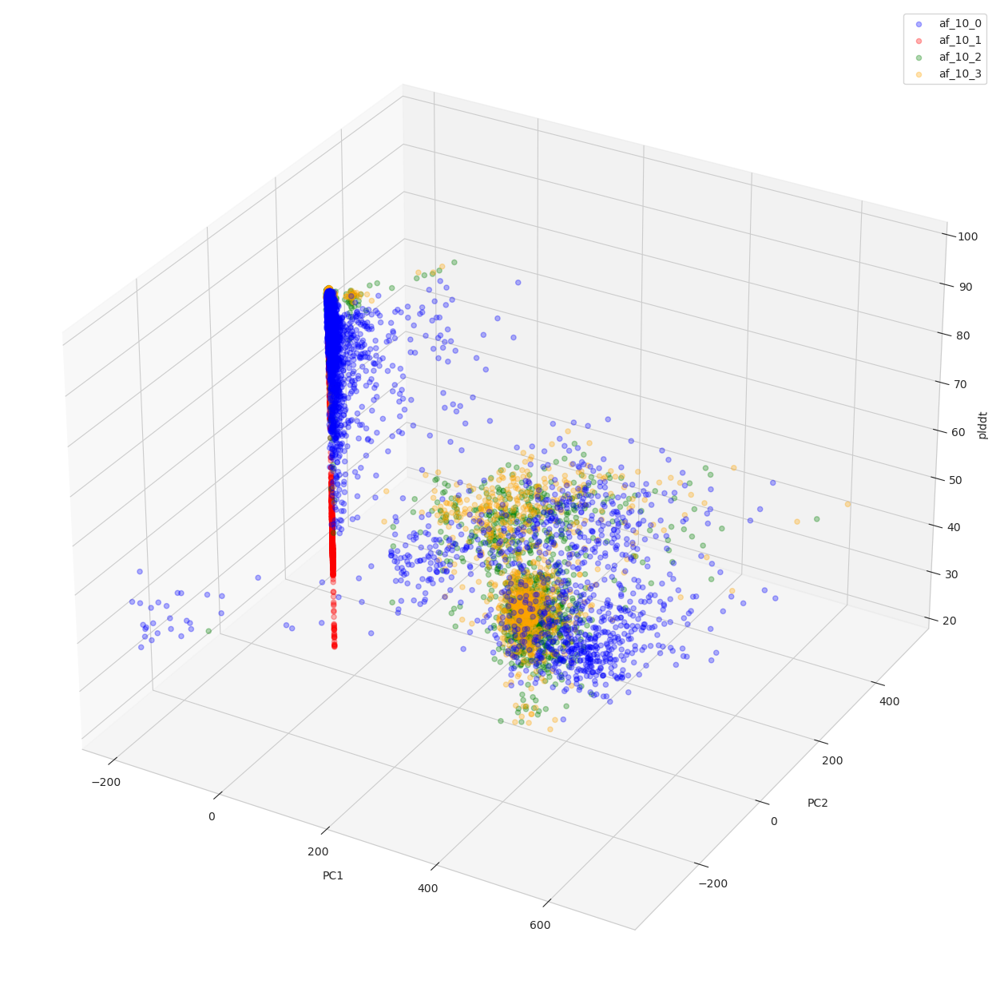

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import json

# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Create a 3D plot
fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')




key = "plddt"
af_10_0_plddt = extract_key_af_sample(af_10_0_ranks, key)
af_10_1_plddt = extract_key_af_sample(af_10_1_ranks, key)
af_10_2_plddt = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_plddt = extract_key_af_sample(af_10_3_ranks, key)


# Plotting
ax.scatter(af_10_0_transformed[:,0], af_10_0_transformed[:,1], af_10_0_plddt, label="af_10_0", alpha=0.3, c="Blue")
ax.scatter(af_10_1_transformed[:,0], af_10_1_transformed[:,1], af_10_1_plddt, label="af_10_1", alpha=0.3, c="Red")
ax.scatter(af_10_2_transformed[:,0], af_10_2_transformed[:,1], af_10_2_plddt, label="af_10_2", alpha=0.3, c="Green")
ax.scatter(af_10_3_transformed[:,0], af_10_3_transformed[:,1], af_10_3_plddt, label="af_10_3", alpha=0.3, c="Orange")

# Set the axis labels and title
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("plddt")

plt.legend()
plt.show()


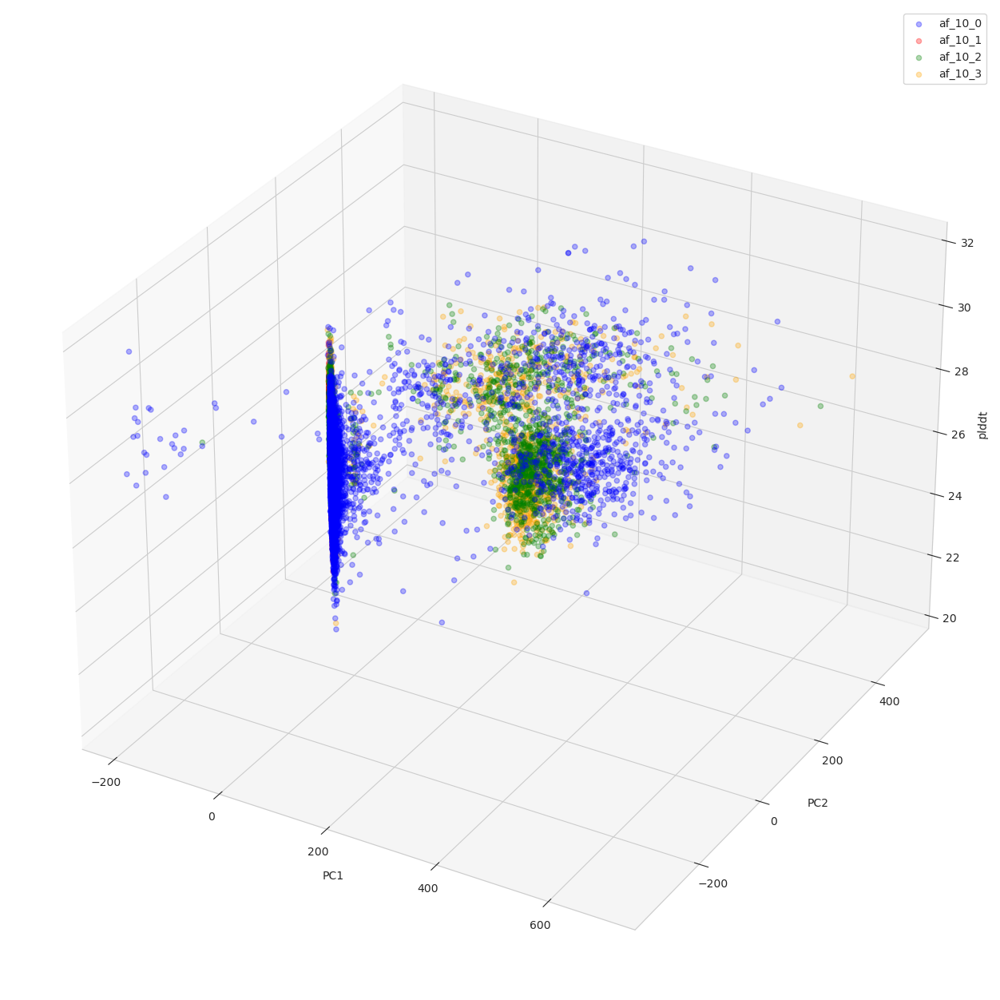

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import json

# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Create a 3D plot
fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')




key = "max_pae"
af_10_0_plddt = extract_key_af_sample(af_10_0_ranks, key)
af_10_1_plddt = extract_key_af_sample(af_10_1_ranks, key)
af_10_2_plddt = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_plddt = extract_key_af_sample(af_10_3_ranks, key)


# Plotting
ax.scatter(af_10_0_transformed[:,0], af_10_0_transformed[:,1], af_10_0_plddt, label="af_10_0", alpha=0.3, c="Blue")
ax.scatter(af_10_1_transformed[:,0], af_10_1_transformed[:,1], af_10_1_plddt, label="af_10_1", alpha=0.3, c="Red")
ax.scatter(af_10_2_transformed[:,0], af_10_2_transformed[:,1], af_10_2_plddt, label="af_10_2", alpha=0.3, c="Green")
ax.scatter(af_10_3_transformed[:,0], af_10_3_transformed[:,1], af_10_3_plddt, label="af_10_3", alpha=0.3, c="Orange")

# Set the axis labels and title
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("plddt")

plt.legend()
plt.show()


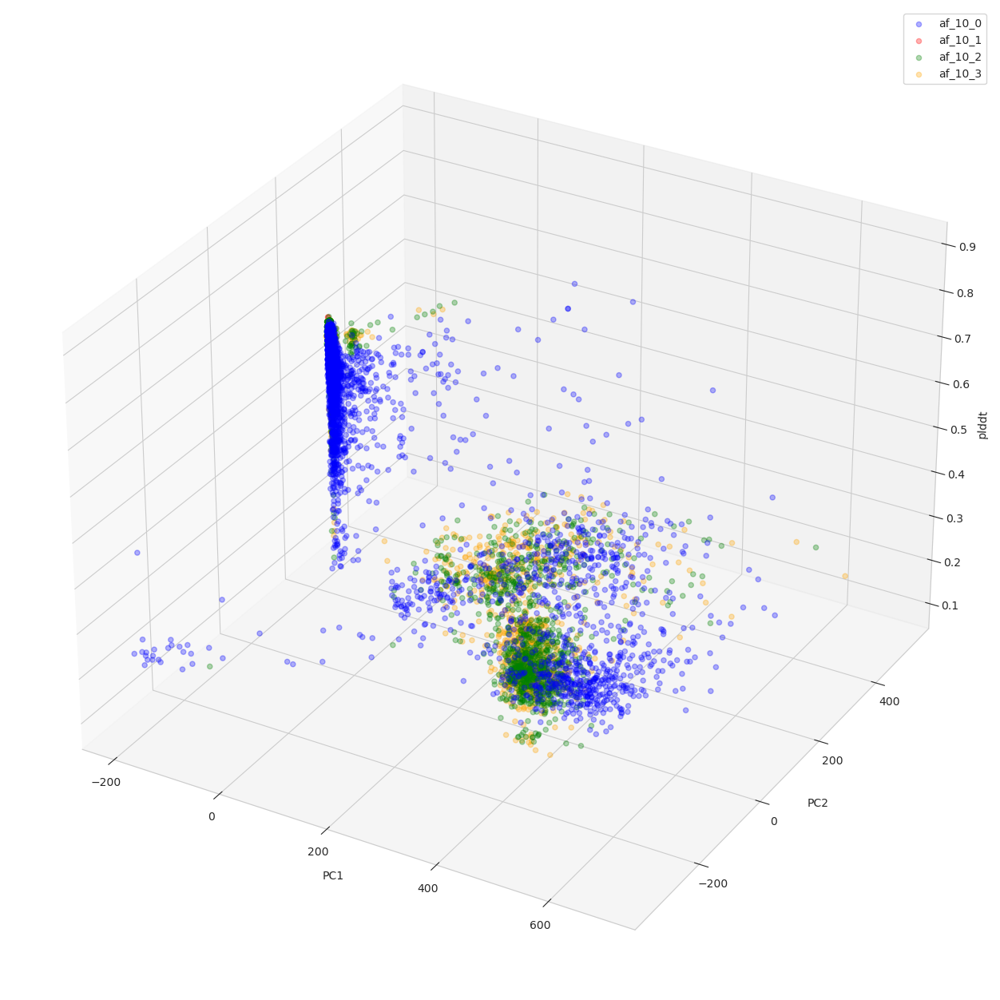

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import json

# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Create a 3D plot
fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')




key = "ptm"
af_10_0_plddt = extract_key_af_sample(af_10_0_ranks, key)
af_10_1_plddt = extract_key_af_sample(af_10_1_ranks, key)
af_10_2_plddt = extract_key_af_sample(af_10_2_ranks, key)
af_10_3_plddt = extract_key_af_sample(af_10_3_ranks, key)


# Plotting
ax.scatter(af_10_0_transformed[:,0], af_10_0_transformed[:,1], af_10_0_plddt, label="af_10_0", alpha=0.3, c="Blue")
ax.scatter(af_10_1_transformed[:,0], af_10_1_transformed[:,1], af_10_1_plddt, label="af_10_1", alpha=0.3, c="Red")
ax.scatter(af_10_2_transformed[:,0], af_10_2_transformed[:,1], af_10_2_plddt, label="af_10_2", alpha=0.3, c="Green")
ax.scatter(af_10_3_transformed[:,0], af_10_3_transformed[:,1], af_10_3_plddt, label="af_10_3", alpha=0.3, c="Orange")

# Set the axis labels and title
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("plddt")

plt.legend()
plt.show()


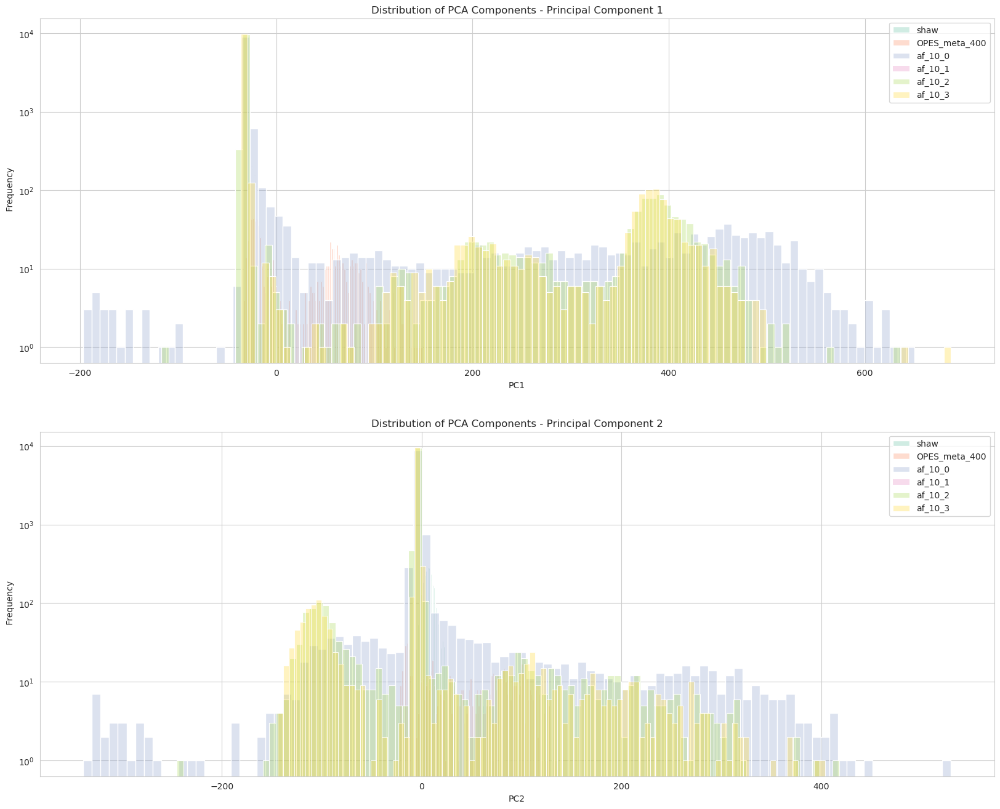

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Set the style and color palette
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Data Preparation
# Assuming you have these numpy arrays from PCA transformations
# e.g., plumed_transformed = np.array([...])

# Define a function to plot histograms for each PCA axis
def plot_pca_histograms(data, labels, title_prefix):
    plt.figure(figsize=(20, 16))

    # Histogram for PC1
    plt.subplot(2, 1, 1)  # 1 row, 2 columns, 1st subplot
    for i, label in enumerate(labels):
        sns.histplot(data[i][:, 0], bins=100, kde=False, label=label, alpha=0.3)
    plt.title(f'{title_prefix} - Principal Component 1')
    plt.xlabel('PC1')
    plt.ylabel(' Frequency')
    plt.yscale('log')
    plt.legend()

    # Histogram for PC2
    plt.subplot(2, 1, 2)  # 1 row, 2 columns, 2nd subplot
    for i, label in enumerate(labels):
        sns.histplot(data[i][:, 1], bins=100, kde=False, label=label, alpha=0.3)
    plt.title(f'{title_prefix} - Principal Component 2')
    plt.xlabel('PC2')
    plt.ylabel(' Frequency')
    plt.legend()
    plt.yscale('log')
    plt.show()

# Collect data and labels
data = [shaw_traj_transformed, plumed_transformed, af_10_0_transformed, af_10_1_transformed,af_10_2_transformed, af_10_3_transformed]
labels = ['shaw', 'OPES_meta_400', 'af_10_0','af_10_1', 'af_10_2', 'af_10_3']

# Plot histograms
plot_pca_histograms(data, labels, "Distribution of PCA Components")


/tmp/ipykernel_1503903/810925992.py:10: UserWarning:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.



ValueError: 'c' argument has 3 elements, which is inconsistent with 'x' and 'y' with size 808.

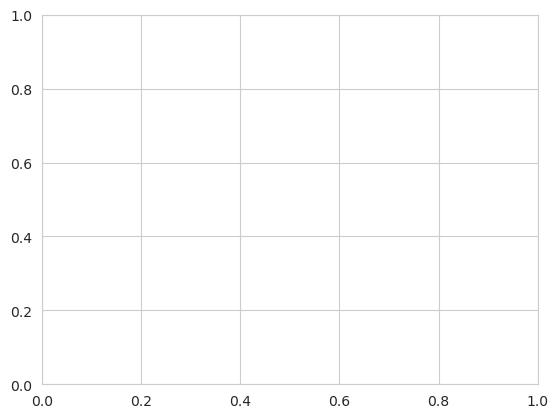

In [ ]:
import matplotlib.pyplot as plt

# Get the PLUMED indexes
plumed_indexes = [0, 1, 2]  # Replace with the actual PLUMED indexes

# Get the transformed coordinates
transformed_coords = plumed_transformed

# Create a scatter plot
plt.scatter(transformed_coords[:, 0], transformed_coords[:, 1], c=plumed_indexes, cmap='viridis')

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('PLUMED Index')

# Add labels and title
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Coloring by PLUMED Index')

# Show the plot
plt.show()